In [126]:
import pandas as pd 
import seaborn as sns 
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib.ticker as ticker 
from scipy.stats import shapiro, kruskal, circmean, linregress, spearmanr, circstd
from scikit_posthocs import posthoc_dunn 
from typing import Dict

plt.style.use('sciencemod.mplstyle')

directories = ['deep_recycle', 'deep_dropout', 'shallow_recycle', 'shallow_dropout']
labels = {'deep_recycle': 'Deep MSA + Recycle', 'deep_dropout': 'Deep MSA + Dropout', 'shallow_recycle': 'Shallow MSA + Recycle', 'shallow_dropout': 'Shallow MSA + Dropout' }
palette = sns.color_palette().as_hex()[0:4] 
colors = {'deep_recycle': palette[0], 'deep_dropout': palette[1], 'shallow_recycle': palette[2], 'shallow_dropout': palette[3]}
save_dir = './images/'

## Global metrics

#### Utilities

In [161]:
def load_data(variable: str, extension: str = 'csv'):
    root = './results'
    dfs = {}
    for dir in directories:
        dfs[dir] = pd.read_csv(f'{root}/{dir}/{variable}.{extension}')
    return dfs 

def ensemble_average(dfs: Dict[str, pd.DataFrame], variable: str) -> Dict[str, float]:
    avgs = {}
    for label, df in dfs.items():
        result = (df[variable]**2).sum() / df[variable].count() 
        avgs[label] = np.sqrt(result) 
    return avgs


def normality_test(data: Dict[str, pd.DataFrame], variable: str): 
    print("Shapiro-Wilk normality test. H0: data is normally distributed.")
    for label, df in data.items():
        stat, p = shapiro(df[variable]) 
        print(f"Data: {label}")
        print(f"Statistics = {stat:.3f}, p-value = {p:.3e}")

def kruskal_wallis_test(data: Dict[str, pd.DataFrame], variable: str): 
    print("Kruskal-Wallis test. H0: samples have the same central tendency and come from the same distribution (mean rank of the groups is the same).")
    data_list = [df[variable].values for df in data.values()]
    stat, p = kruskal(*data_list)
    print(f"Statistics = {stat:.3f}, p-value = {p:.3e}")
    return p < 0.05 # True if at least one group is different from the others

def post_hoc_test(data: Dict[str, pd.DataFrame], variable: str):
    print("Post-hoc Dunn's test. Detects which groups differ from one another.")
    data_cp = data.copy()
    for label, df in data_cp.items():
        df['label'] = label
    data_cp = pd.concat(data_cp.values())
    p_values = posthoc_dunn(data_cp, val_col=variable, group_col='label', p_adjust='holm')
    print(p_values)
    return p_values

def format_one_digit(x, pos):
    return f'{x:.1f}'

def setup(ax, ymajor=None, xmajor=None, yminor=None, xminor=None):
    if xmajor: 
        ax.xaxis.set_major_locator(ticker.LinearLocator(numticks=xmajor))
        ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_one_digit))
    if ymajor: 
        ax.yaxis.set_major_locator(ticker.LinearLocator(numticks=ymajor))
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_one_digit))
    if xminor: 
        ax.xaxis.set_minor_locator(ticker.AutoMinorLocator(xminor))
    if yminor: 
        ax.yaxis.set_minor_locator(ticker.AutoMinorLocator(yminor))    

def plot_histogram(dfs: Dict[str, pd.DataFrame], variable: str, labels: Dict[str, str], **kwargs):
    _, ax = plt.subplots()
    for label, df in dfs.items():
        sns.histplot(data=df, x=variable, kde=False, stat='proportion', element='step', label=labels[label], color=colors[label], **kwargs)
    if variable == 'Rg':
        ax.set_xlabel(r'$R_g$ ($\mathrm{\AA}$)')
        ax.set_ylim(0, 0.5)
    if variable == 'Dmax':
        ax.set_xlabel(r'$D_{max}$ ($\mathrm{\AA}$)')
        ax.set_ylim(0, 0.4)
    if variable == 'end_to_end':
        ax.set_xlabel(r'$R_{e}$ ($\mathrm{\AA}$)')
    ax.legend(fontsize=10)
    setup(ax, 4, 4, 2, 2)
    return ax 

def plot_kde(dfs: Dict[str, pd.DataFrame], variable: str, labels: Dict[str, str], **kwargs):
    _, ax = plt.subplots()
    for label, df in dfs.items():
        sns.kdeplot(data=df, x=variable, label=labels[label], color=colors[label], **kwargs)
    ax.set_xlim(left=0)
    if variable == 'Rg':
        ax.set_xlabel(r'$R_g$ ($\mathrm{\AA}$)')
        ax.set_ylim(0, 0.4)
    if variable == 'Dmax':
        ax.set_xlabel(r'$D_{max}$ ($\mathrm{\AA}$)')
        ax.set_ylim(0, 0.4)
    if variable == 'end_to_end':
        ax.set_xlabel(r'$R_{e}$ ($\mathrm{\AA}$)')
    ax.legend(fontsize=10)
    setup(ax, None, 4, 2, 2)
    return ax 

def plot_violin(dfs: Dict[str, pd.DataFrame], variable: str, labels: Dict[str, str], **kwargs):
    _, ax = plt.subplots()
    data = pd.concat([
        dfs['deep_recycle'].assign(Group=labels['deep_recycle']),
        dfs['deep_dropout'].assign(Group=labels['deep_dropout']),
        dfs['shallow_recycle'].assign(Group=labels['shallow_recycle']),
        dfs['shallow_dropout'].assign(Group=labels['shallow_dropout']),
    ])
    sns.violinplot(data=data, x='Group', y=variable, ax=ax, density_norm='area', inner='quartile', hue='Group', **kwargs)
    ax.set_xlabel('')
    if variable == 'Rg':
        ax.set_ylabel(r'$R_g$ ($\mathrm{\AA}$)')
        ax.set_ylim(25, 45)
    if variable == 'Dmax':
        ax.set_ylabel(r'$D_{max}$ ($\mathrm{\AA}$)')
        ax.set_ylim(70, 140)
    if variable == 'end_to_end':
        ax.set_ylabel(r'$R_{e}$ ($\mathrm{\AA}$)')
        ax.set_ylim(0, 120)    
    plt.xticks(rotation=30, fontsize=8, ticks=list(labels.values()), labels=map(lambda x: x.split('+')[0] + '\n+' + x.split('+')[-1], labels.values()) )
    plt.tight_layout()
    return ax 

def plot_stacked_bar(dfs: Dict[str, pd.DataFrame], labels: Dict[str, str], exp: pd.DataFrame, **kwargs):
    data = pd.concat([
    dfs['deep_recycle'].assign(Group=labels['deep_recycle']),
    dfs['deep_dropout'].assign(Group=labels['deep_dropout']),
    dfs['shallow_recycle'].assign(Group=labels['shallow_recycle']),
    dfs['shallow_dropout'].assign(Group=labels['shallow_dropout']),
    exp.assign(Group='Exp.'),
    ])
    data['sheet'] = data['sheet'] + data['helix']
    data['coil'] = data['coil'] + data['sheet']
    dssp_pallete = sns.color_palette("Set2").as_hex() 
    sns.barplot(data=data, x='Group', y='coil', linewidth=0,  color=dssp_pallete[0], dodge=False, errorbar=None, label='Coil', **kwargs)
    sns.barplot(data=data, x='Group', y='sheet', color=dssp_pallete[1], linewidth=0, dodge=False, errorbar=None, label='Sheet', **kwargs)
    sns.barplot(data=data, x='Group', y='helix', color=dssp_pallete[2], linewidth=0, dodge=False, errorbar=None, label='Helix', **kwargs)
    plt.xticks(rotation=30, fontsize=8, ticks=list(labels.values()) + ['Exp.'] , labels=list(map(lambda x: x.split('+')[0] + '\n+' + x.split('+')[-1], labels.values())) + ['Exp.'] )
    plt.xlabel('')
    plt.ylabel('Percentage', fontsize=12)
    plt.tight_layout()


def plot_lines(dfs: Dict[str, pd.DataFrame], labels: Dict[str, str], variable=None, **kwargs):
    _, ax = plt.subplots()
    labels_newline = list(map(lambda x: x.split('+')[0] + '\n+' + x.split('+')[-1], labels.values()))
    for i, (key, df) in enumerate(dfs.items()):
        sns.lineplot(data=df, 
                    #  label=labels_newline[i], 
                     color=colors[key], 
                     alpha=1, 
                     ax=ax, 
                     **kwargs)
    ax.set_xlabel('Residue number')
    if variable == 'plddt':
        ax.set_ylim(30, 100)
        ax.set_ylabel('pLDDT')
    elif variable == 'deltaphi':
        ax.set_ylim(0, 155)
        ax.set_ylabel(r'$\Delta \phi$ ($^\circ$)')
    elif variable == 'deltapsi':
        ax.set_ylim(0, 80)
        ax.set_ylabel(r'$\Delta \psi$ ($^\circ$)')
    setup(ax, 4, None, 2, 2)
    # plt.legend(loc='upper left', bbox_to_anchor=(0.99, 1.02), fontsize=12)
    return ax 

### Radius of gyration

In [128]:
rg_exp = 60.95 # average
rg_exp_error = 3.09 # error, computed from max. deviation from mean 

#### Plots

<Axes: xlabel='$R_g$ ($\\mathrm{\\AA}$)', ylabel='Proportion'>

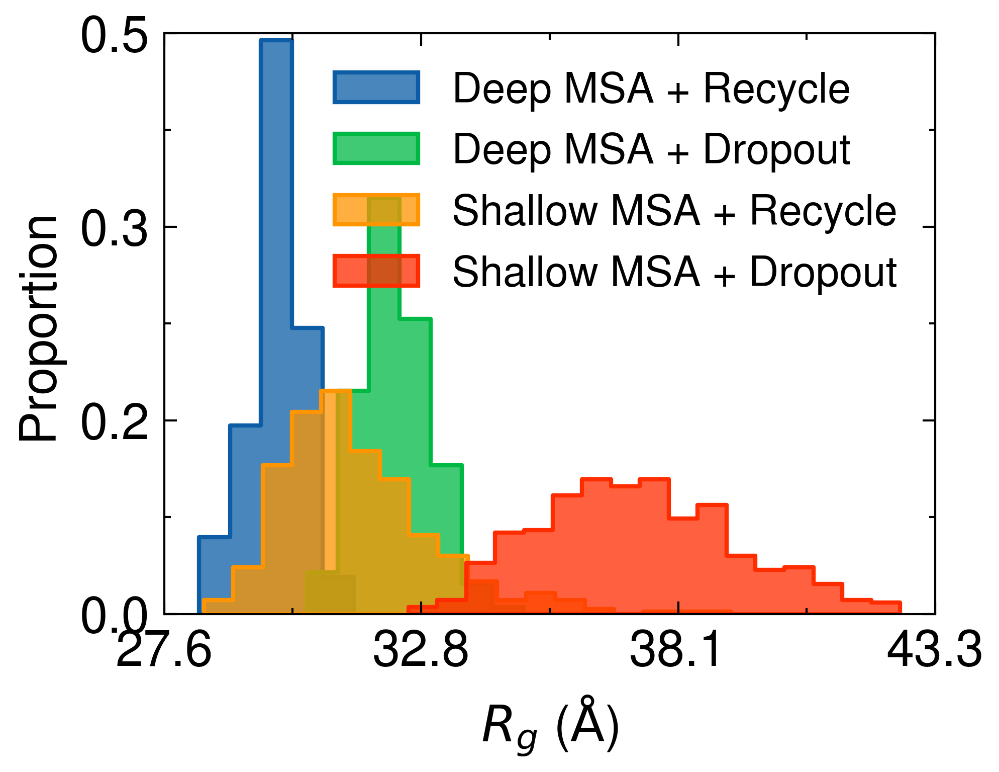

In [129]:
rgs = load_data('rg', 'csv')
plot_histogram(rgs, 'Rg', labels, binwidth=0.6)
# plt.savefig(save_dir + 'rg_hist.pdf', dpi=600, bbox_inches='tight')

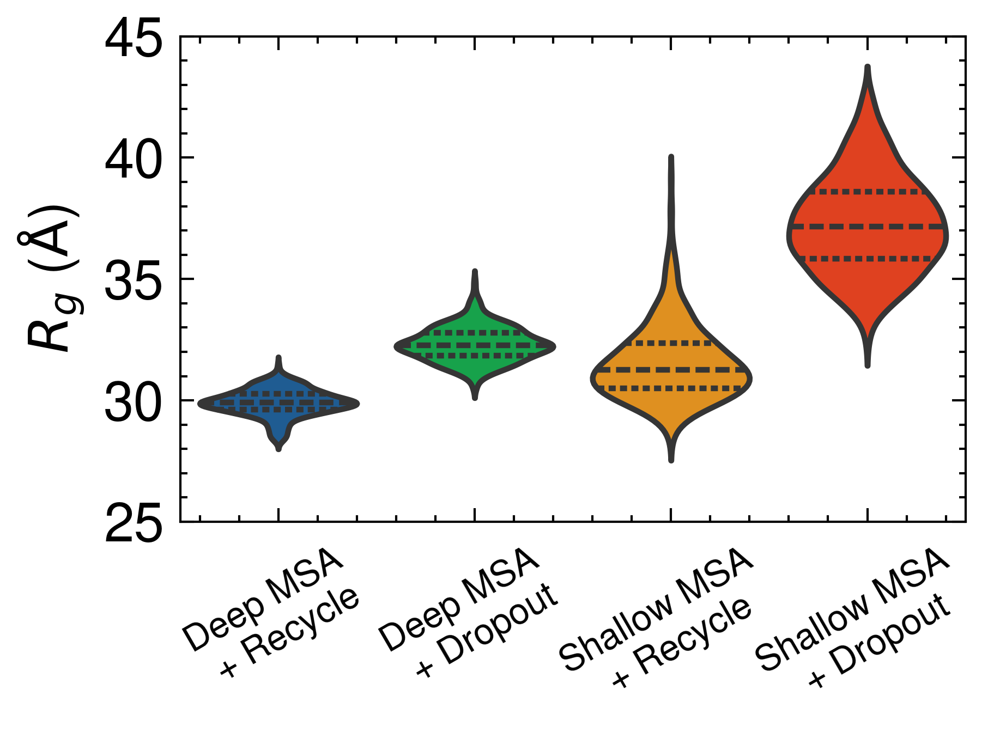

In [130]:
plot_violin(rgs, 'Rg', labels)
plt.savefig(save_dir + 'rg_violin.pdf', dpi=600, bbox_inches='tight')

#### Largest and smallest $R_g$

In [131]:
rgs['shallow_dropout'].sort_values('Rg').iloc[-1, :]

Rg      42.616336
file       sd_203
Name: 332, dtype: object

In [132]:
rgs['deep_recycle'].sort_values('Rg').iloc[0, :]

Rg      28.314037
file       dr_310
Name: 409, dtype: object

#### Rg error

In [133]:
rg_deviations = {}
for label, df in rgs.items():
    avg = df['Rg'].mean() 
    rg_deviations[label] = (avg - rg_exp)/rg_exp * 100 
rg_deviations = pd.DataFrame.from_dict(rg_deviations, orient='index', columns=['Rg deviation (%)'])
print(rg_deviations)

                 Rg deviation (%)
deep_recycle           -50.927929
deep_dropout           -46.981464
shallow_recycle        -48.255035
shallow_dropout        -38.867798


#### Statistical tests

In [134]:
normality_test(rgs, 'Rg')
print("\n")
kruskal_wallis_test(rgs, 'Rg')
print("\n")
p_values = post_hoc_test(rgs, 'Rg')

Shapiro-Wilk normality test. H0: data is normally distributed.
Data: deep_recycle
Statistics = 0.983, p-value = 1.671e-05
Data: deep_dropout
Statistics = 0.992, p-value = 5.981e-03
Data: shallow_recycle
Statistics = 0.934, p-value = 5.030e-14
Data: shallow_dropout
Statistics = 0.989, p-value = 7.547e-04


Kruskal-Wallis test. H0: samples have the same central tendency and come from the same distribution (mean rank of the groups is the same).
Statistics = 1587.652, p-value = 0.000e+00


Post-hoc Dunn's test. Detects which groups differ from one another.
                  deep_dropout   deep_recycle  shallow_dropout  \
deep_dropout      1.000000e+00  5.339924e-105     1.122461e-65   
deep_recycle     5.339924e-105   1.000000e+00     0.000000e+00   
shallow_dropout   1.122461e-65   0.000000e+00     1.000000e+00   
shallow_recycle   5.197310e-15   2.978291e-44    2.895777e-137   

                 shallow_recycle  
deep_dropout        5.197310e-15  
deep_recycle        2.978291e-44  
shall

### Maximum intramolecular distance

In [135]:
dmax_exp = 230 # average
dmax_exp_error = 10 # error, computed from max. deviation from mean

<Axes: xlabel='$D_{max}$ ($\\mathrm{\\AA}$)', ylabel='Proportion'>

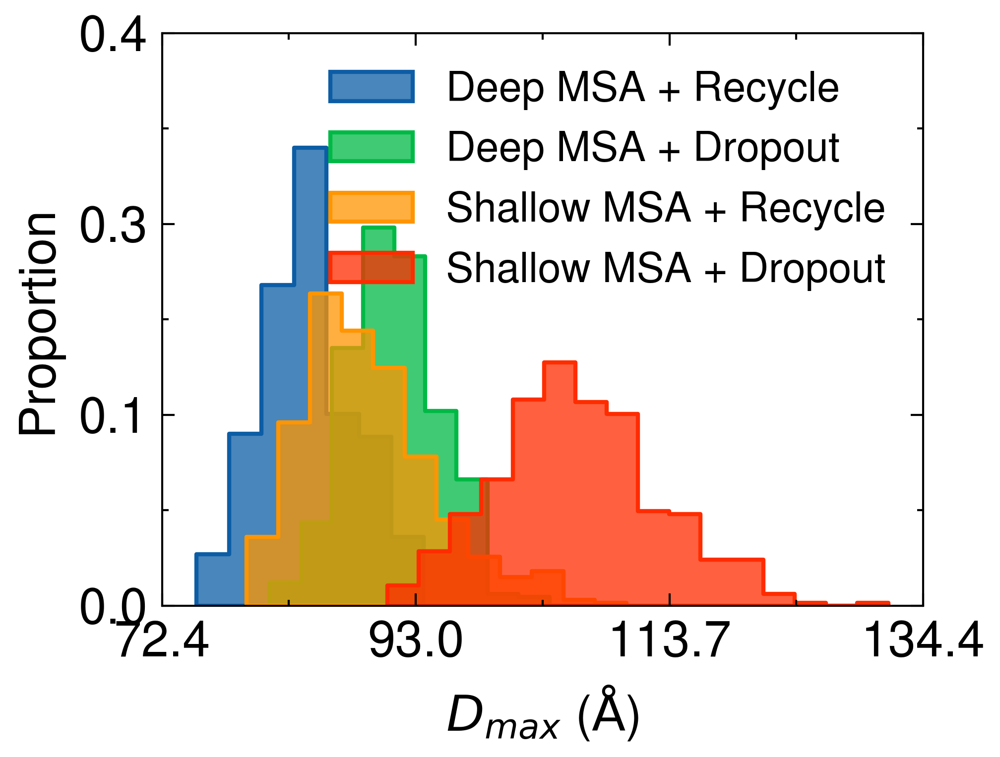

In [136]:
# Regular histogram
dmaxs = load_data('dmax', 'csv')
plot_histogram(dmaxs, 'Dmax', labels, binwidth=2.5)
# plt.savefig(save_dir + 'dmax_hist.pdf', dpi=600, bbox_inches='tight')

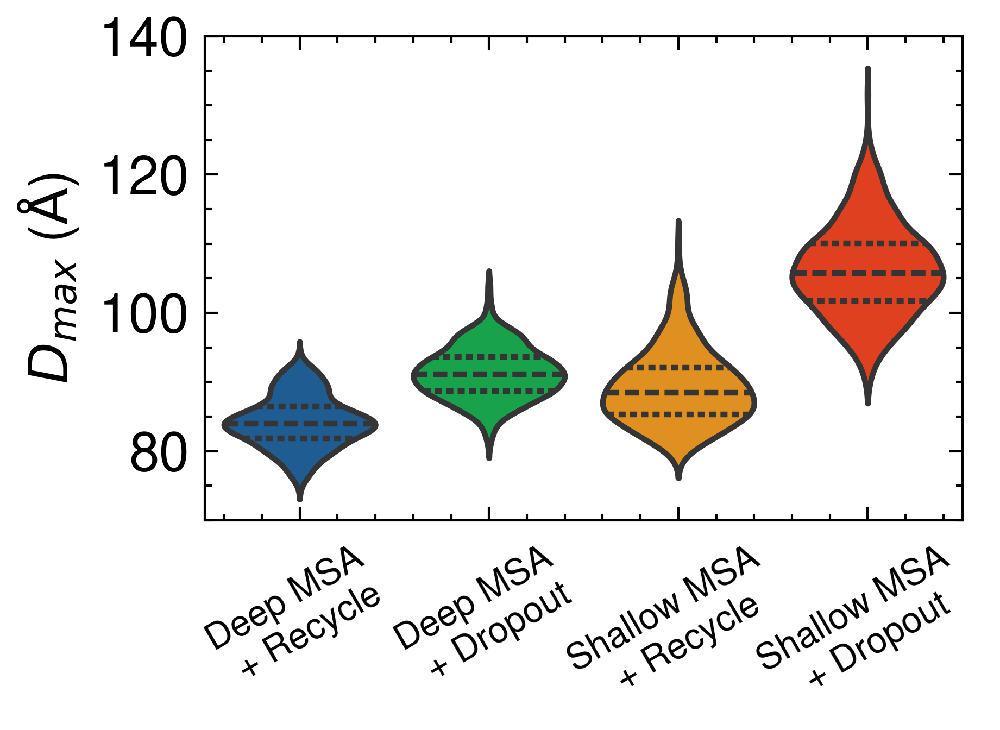

In [137]:
# Violin plot of the distributions
plot_violin(dmaxs, 'Dmax', labels)
plt.savefig(save_dir + 'dmax_violin.pdf', dpi=600, bbox_inches='tight')

#### Dmax error

In [138]:
dmax_deviations = {}
for label, df in dmaxs.items():
    avg = df['Dmax'].mean() 
    dmax_deviations[label] = (avg - dmax_exp)/dmax_exp * 100 
dmax_deviations = pd.DataFrame.from_dict(dmax_deviations, orient='index', columns=['Dmax deviation (%)'])
print(dmax_deviations)

                 Dmax deviation (%)
deep_recycle             -63.373561
deep_dropout             -60.307469
shallow_recycle          -61.198931
shallow_dropout          -53.808150


#### Statistical tests

In [139]:
normality_test(dmaxs, 'Dmax')
print("\n")
kruskal_wallis_test(dmaxs, 'Dmax')
print("\n")
p_values = post_hoc_test(dmaxs, 'Dmax')

Shapiro-Wilk normality test. H0: data is normally distributed.
Data: deep_recycle
Statistics = 0.989, p-value = 6.168e-04
Data: deep_dropout
Statistics = 0.995, p-value = 1.487e-01
Data: shallow_recycle
Statistics = 0.960, p-value = 1.822e-10
Data: shallow_dropout
Statistics = 0.991, p-value = 5.075e-03


Kruskal-Wallis test. H0: samples have the same central tendency and come from the same distribution (mean rank of the groups is the same).
Statistics = 1368.305, p-value = 2.222e-296


Post-hoc Dunn's test. Detects which groups differ from one another.
                 deep_dropout   deep_recycle  shallow_dropout  shallow_recycle
deep_dropout     1.000000e+00   2.141837e-66     9.480009e-79     4.156558e-09
deep_recycle     2.141837e-66   1.000000e+00    3.532054e-285     8.546343e-30
shallow_dropout  9.480009e-79  3.532054e-285     1.000000e+00    2.025465e-134
shallow_recycle  4.156558e-09   8.546343e-30    2.025465e-134     1.000000e+00


### End-to-end distance

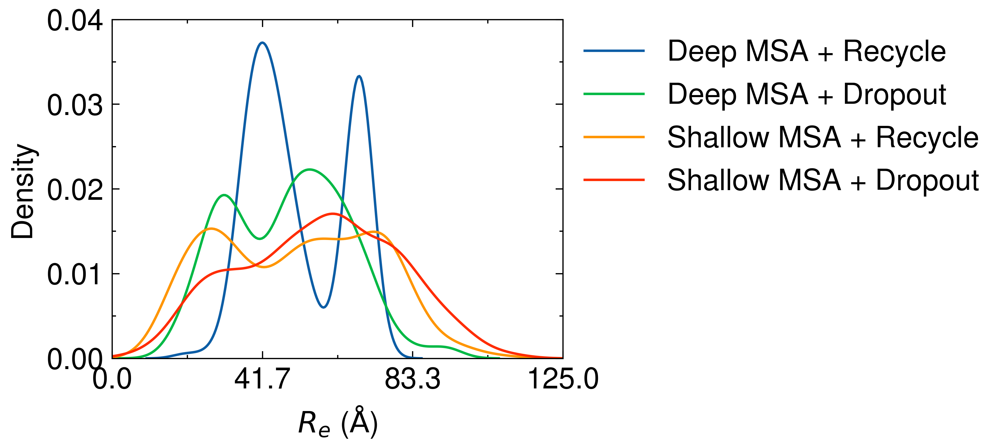

In [140]:
e2es = load_data('e2e', 'csv')
plot_kde(e2es, 'end_to_end', labels, fill=False, bw_adjust=0.9, clip=(0, 125))
plt.xlim(right=125)
plt.ylim(top=0.04)
plt.legend(loc='upper left', bbox_to_anchor=(0.99, 1.02), fontsize=12)
# plt.savefig(save_dir + 'e2e_kde.pdf', dpi=600, bbox_inches='tight')

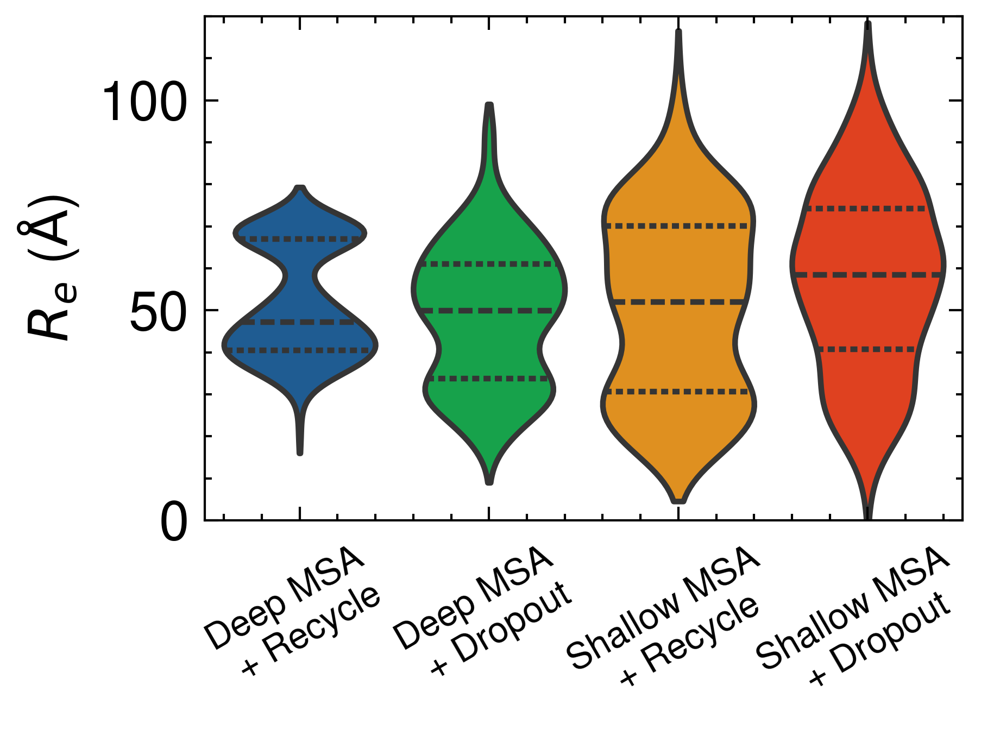

In [141]:
plot_violin(e2es, 'end_to_end', labels, cut=1)
plt.savefig(save_dir + 'e2e_violin.pdf', dpi=600, bbox_inches='tight')

#### Statistical tests

In [142]:
normality_test(e2es, 'end_to_end')
print("\n")
kruskal_wallis_test(e2es, 'end_to_end')
print("\n")
p_values = post_hoc_test(e2es, 'end_to_end')

Shapiro-Wilk normality test. H0: data is normally distributed.
Data: deep_recycle
Statistics = 0.892, p-value = 3.148e-18
Data: deep_dropout
Statistics = 0.978, p-value = 9.443e-07
Data: shallow_recycle
Statistics = 0.963, p-value = 5.657e-10
Data: shallow_dropout
Statistics = 0.988, p-value = 3.553e-04


Kruskal-Wallis test. H0: samples have the same central tendency and come from the same distribution (mean rank of the groups is the same).
Statistics = 46.465, p-value = 4.517e-10


Post-hoc Dunn's test. Detects which groups differ from one another.
                 deep_dropout  deep_recycle  shallow_dropout  shallow_recycle
deep_dropout     1.000000e+00      0.024113     1.617333e-10         0.068433
deep_recycle     2.411332e-02      1.000000     2.409978e-04         0.594058
shallow_dropout  1.617333e-10      0.000241     1.000000e+00         0.000027
shallow_recycle  6.843253e-02      0.594058     2.749413e-05         1.000000


### Average % of helices, beta-sheets, and coil

In [143]:
helix_exp = 21.69 
beta_exp = 5.39 
coil_exp = 72.91 
exp_df = pd.DataFrame({'helix': [helix_exp], 'sheet': [beta_exp], 'coil': [coil_exp]})

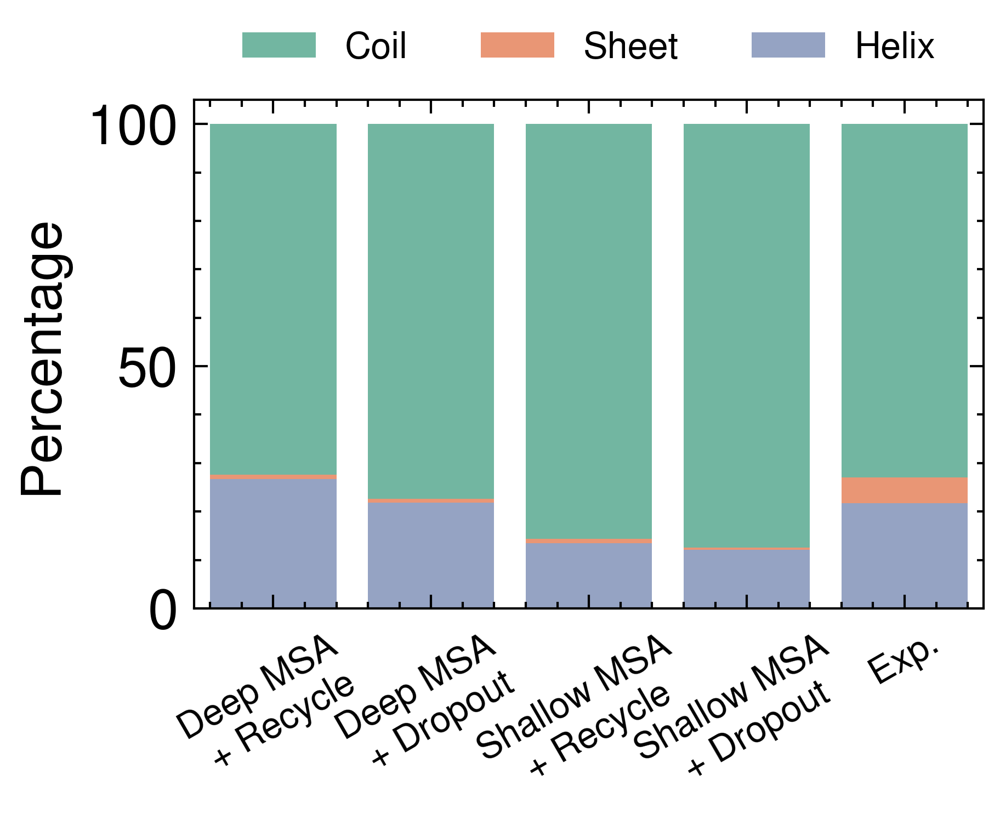

In [144]:
dssps = load_data('dssp', 'csv')
plot_stacked_bar(dssps, labels, exp_df)
plt.legend(ncol=3, loc='upper center', bbox_to_anchor=(0.5, 1.2), fontsize=8)
plt.savefig(save_dir + 'dssp_bar.pdf', dpi=600, bbox_inches='tight')

In [145]:
sec_deviations = {}
for label, df in dssps.items():
    helix = df['helix'].mean() 
    beta = df['sheet'].mean() 
    print(f"beta = {beta} ({label})")
    coil = df['coil'].mean() 
    sec_deviations[label] = {
        'helix': (helix - helix_exp)/helix_exp * 100,
        'sheet': (beta - beta_exp)/beta_exp * 100,
        'coil': (coil - coil_exp)/coil_exp * 100
    } 
sec_deviations = pd.DataFrame.from_dict(sec_deviations, orient='index')
sec_deviations = sec_deviations.rename(columns={'helix': 'Helix deviation (%)', 'sheet': 'Sheet deviation (%)', 'coil': 'Coil deviation (%)'})
print(sec_deviations)

beta = 0.9187214611872142 (deep_recycle)
beta = 0.8109589041095887 (deep_dropout)
beta = 0.8054794520547942 (shallow_recycle)
beta = 0.4547945205479451 (shallow_dropout)
                 Helix deviation (%)  Sheet deviation (%)  Coil deviation (%)
deep_recycle               23.264514           -82.955075           -0.774646
deep_dropout                0.431358           -84.954380            6.165793
shallow_recycle           -37.710916           -85.056040           17.520255
shallow_dropout           -44.308658           -91.562254           19.964001


#### Statistical tests

In [146]:
normality_test(dssps, 'sheet')
print("\n")
kruskal_wallis_test(dssps, 'sheet')
print("\n")
p_values = post_hoc_test(dssps, 'sheet')

Shapiro-Wilk normality test. H0: data is normally distributed.
Data: deep_recycle
Statistics = 0.049, p-value = 5.168e-44
Data: deep_dropout
Statistics = 0.462, p-value = 3.955e-36
Data: shallow_recycle
Statistics = 0.375, p-value = 4.016e-38
Data: shallow_dropout
Statistics = 0.637, p-value = 3.550e-31


Kruskal-Wallis test. H0: samples have the same central tendency and come from the same distribution (mean rank of the groups is the same).
Statistics = 465.947, p-value = 1.142e-100


Post-hoc Dunn's test. Detects which groups differ from one another.
                 deep_dropout  deep_recycle  shallow_dropout  shallow_recycle
deep_dropout     1.000000e+00  3.642283e-06     2.433504e-53     8.904975e-01
deep_recycle     3.642283e-06  1.000000e+00     2.107815e-90     2.732339e-06
shallow_dropout  2.433504e-53  2.107815e-90     1.000000e+00     1.638773e-52
shallow_recycle  8.904975e-01  2.732339e-06     1.638773e-52     1.000000e+00


In [147]:
dssps['deep_recycle']['sheet'].mean(), dssps['deep_dropout']['sheet'].mean(), dssps['shallow_recycle']['sheet'].mean(), dssps['shallow_dropout']['sheet'].mean()

(np.float64(0.9187214611872142),
 np.float64(0.8109589041095887),
 np.float64(0.8054794520547942),
 np.float64(0.4547945205479451))

### Comparision w/ experimental data - global evaluation

In [148]:
exp_merged = rg_deviations.join(dmax_deviations).join(sec_deviations)
print(exp_merged)

                 Rg deviation (%)  Dmax deviation (%)  Helix deviation (%)  \
deep_recycle           -50.927929          -63.373561            23.264514   
deep_dropout           -46.981464          -60.307469             0.431358   
shallow_recycle        -48.255035          -61.198931           -37.710916   
shallow_dropout        -38.867798          -53.808150           -44.308658   

                 Sheet deviation (%)  Coil deviation (%)  
deep_recycle              -82.955075           -0.774646  
deep_dropout              -84.954380            6.165793  
shallow_recycle           -85.056040           17.520255  
shallow_dropout           -91.562254           19.964001  


## Local metrics

### pLDDT
Important domains:
- Transcriptional activation = 1--170 
- L1 = 86--90
- L2 = 142--146 
- L3 = 209--213 

In [149]:
plddt_list = load_data('plddt', 'csv')
for key, df in plddt_list.items(): 
    plddt_list[key] = df.iloc[:, 1:].mean(axis=1)

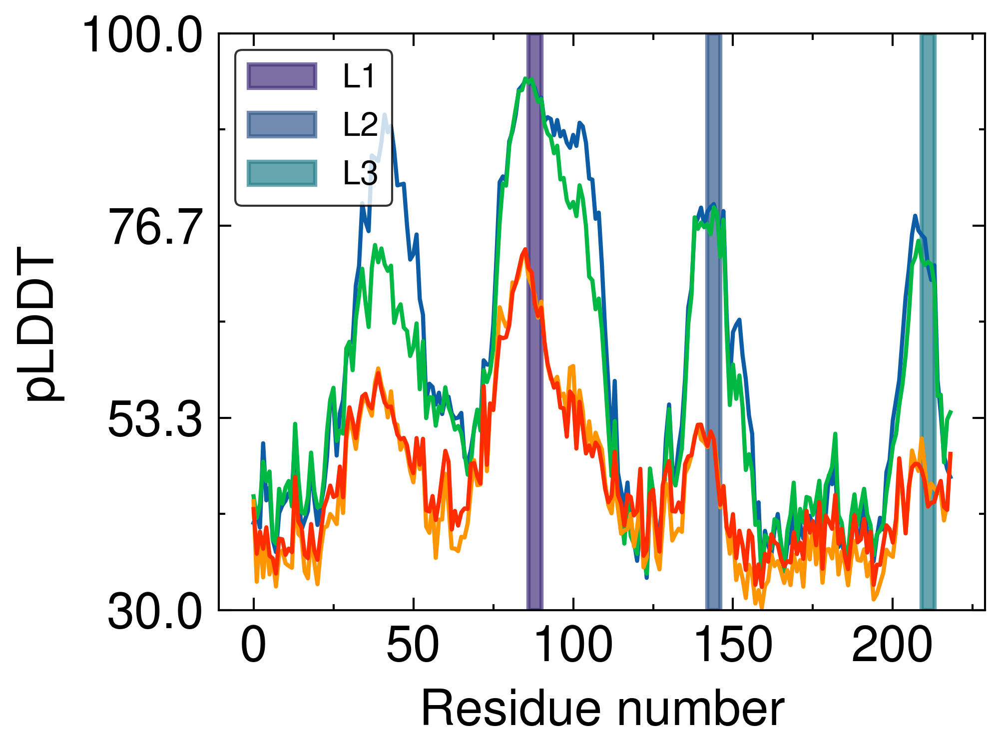

In [172]:
domain_palette = sns.color_palette("viridis").as_hex()
ax = plot_lines(plddt_list, labels, 'plddt')
domains = [
    (86, 90, 'L1'),
    (142, 146, 'L2'),
    (209, 213, 'L3')
]
for idx, (start, end, label) in enumerate(domains):
    ax.axvspan(start, end, color=domain_palette[idx], alpha=0.7, label=label, zorder=-1)
legend = ax.legend(ncol=1, loc='upper left', frameon=True, edgecolor='black', fontsize=8)   
legend.get_frame().set_linewidth(0.5)
# plt.legend(loc='upper left', bbox_to_anchor=(0.99, 1.0), fontsize=8)

plt.savefig(save_dir + 'per_residue_plddt.pdf', dpi=600, bbox_inches='tight')

### Dihedrals

In [109]:
phi_list = load_data('phi', 'csv')
psi_list = load_data('psi', 'csv')
for key, df in phi_list.items():
    phi_list[key] = circmean(df.iloc[:, 1:], high=180, low=-180, axis=1)
for key, df in psi_list.items():
    psi_list[key] = circmean(df.iloc[:, 1:], high=180, low=-180, axis=1)

#### 2D KDE plot

Text(0.5, 0, '$\\phi$ ($^\\circ$)')

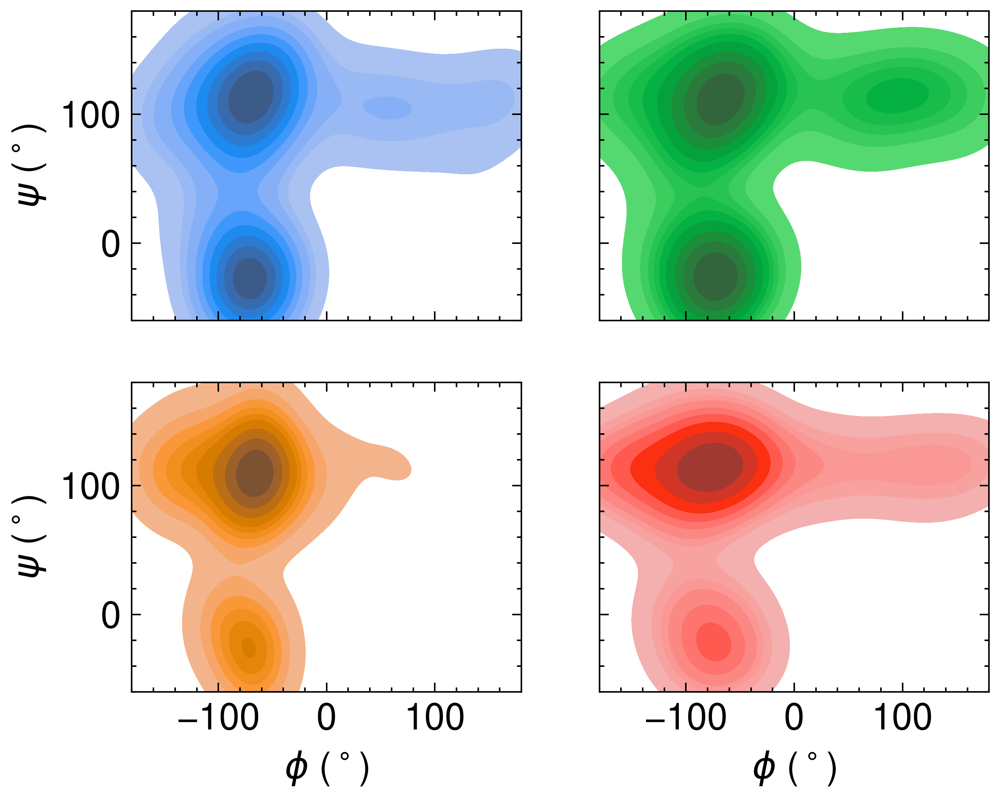

In [110]:
# These plots are not readable at all, so we place each in their own figure. 
figs, axes = plt.subplots(2, 2, figsize=(5, 4), sharey=True, sharex=True)

sns.kdeplot(ax=axes[0,0], x=phi_list['deep_recycle'], y=psi_list['deep_recycle'], label=labels['deep_recycle'], alpha=1, cut=0.3, fill=True, color=sns.color_palette().as_hex()[0], clip=((180, -180), (180, -180)))
axes[0,0].set_xlim(-180, 180)
axes[0,0].set_ylim(-60, 180)
sns.kdeplot(ax=axes[0,1], x=phi_list['deep_dropout'], y=psi_list['deep_dropout'], label=labels['deep_dropout'], alpha=1, cut=0.5, fill=True, color=sns.color_palette().as_hex()[1], clip=((180, -180), (180, -180)))
sns.kdeplot(ax=axes[1,0], x=phi_list['shallow_recycle'], y=psi_list['shallow_recycle'], label=labels['shallow_recycle'],  alpha=1, cut=0.6, fill=True, color=sns.color_palette().as_hex()[2], clip=((160, -180), (180, -180))) # need to clip this one a bit early to avoid some weird disconnected zone
sns.kdeplot(ax=axes[1,1], x=phi_list['shallow_dropout'], y=psi_list['shallow_dropout'], label=labels['shallow_dropout'], alpha=1, cut=0.6, fill=True, color=sns.color_palette().as_hex()[3], clip=((180, -180), (180, -180)))

axes[0,0].set_ylabel(r'$\psi$ ($^\circ$)')
axes[1,0].set_ylabel(r'$\psi$ ($^\circ$)')
axes[1,0].set_xlabel(r'$\phi$ ($^\circ$)')
axes[1,1].set_xlabel(r'$\phi$ ($^\circ$)')

#### Torsional flexibility 

In [111]:
deltaphi_list = load_data('phi', 'csv')
deltapsi_list = load_data('psi', 'csv')
for key, df in deltaphi_list.items():
    deltaphi_list[key] = circstd(df.iloc[:, 1:], high=180, low=-180, axis=1)
for key, df in deltapsi_list.items():
    deltapsi_list[key] = circstd(df.iloc[:, 1:], high=180, low=-180, axis=1)

<Axes: xlabel='Residue number', ylabel='$\\Delta \\phi$ ($^\\circ$)'>

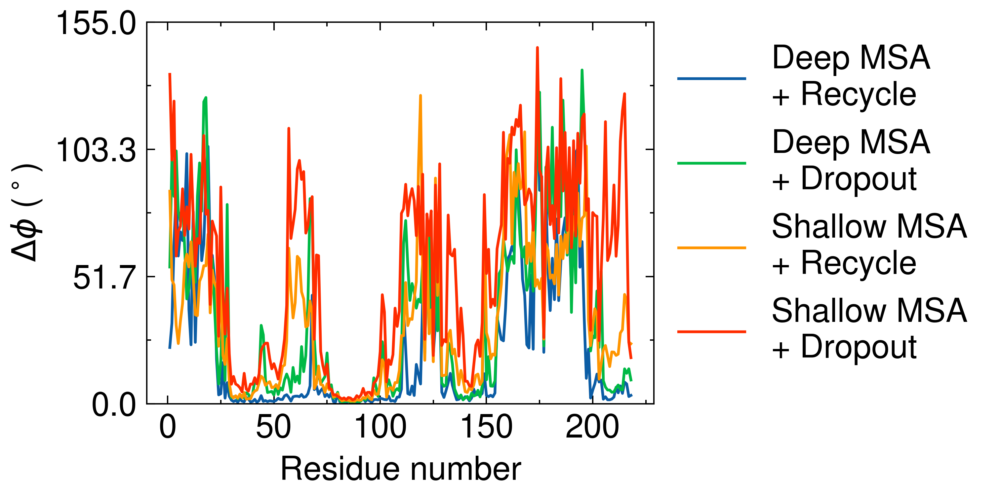

In [112]:
plot_lines(deltaphi_list, labels, 'deltaphi')

<Axes: xlabel='Residue number', ylabel='$\\Delta \\psi$ ($^\\circ$)'>

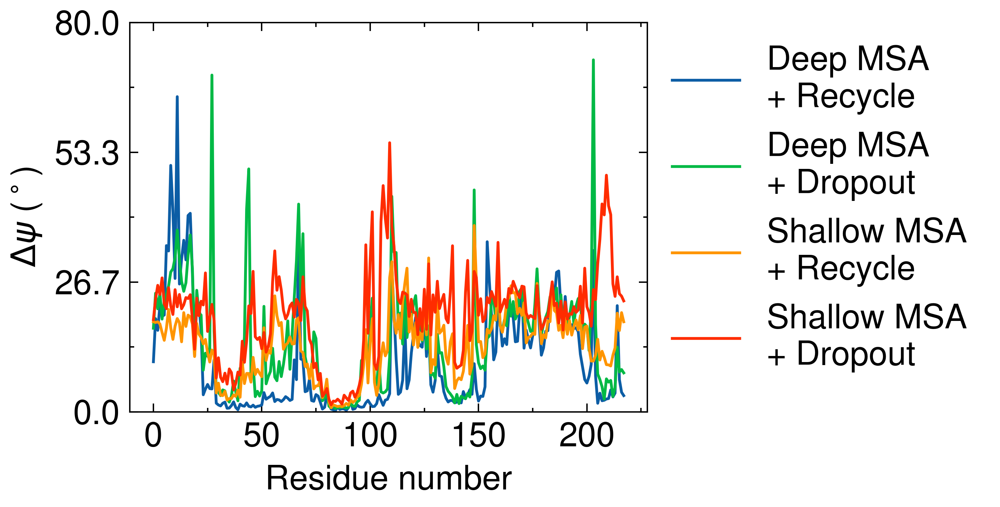

In [113]:
plot_lines(deltapsi_list, labels, 'deltapsi')

### Helicity

In [114]:
helix_list = load_data('helix_percent', 'csv')

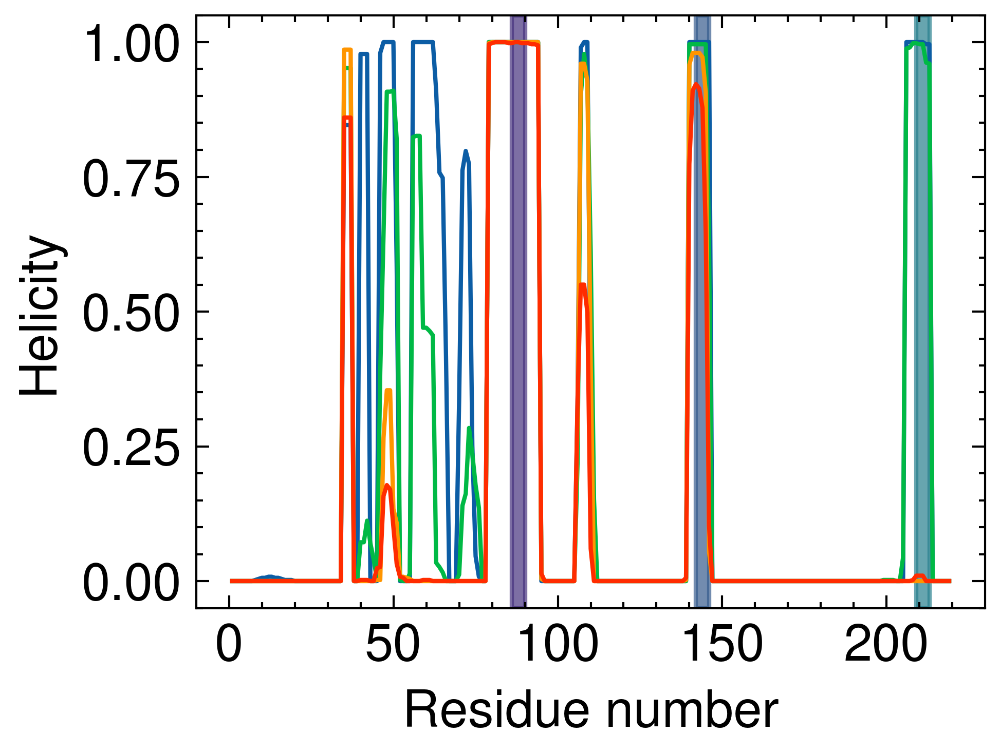

In [115]:
fig, ax = plt.subplots()
for key, df in helix_list.items():
    sns.lineplot(data=df, x='Residue', y='helix', color=colors[key], alpha=1)
domain_palette = sns.color_palette("viridis").as_hex()
domains = [
    (86, 90, 'L1'),
    (142, 146, 'L2'),
    (209, 213, 'L3')
]
for idx, (start, end, label) in enumerate(domains):
    ax.axvspan(start, end, color=domain_palette[idx], alpha=0.7, label=label, zorder=-1)

# plt.legend(loc='upper left', bbox_to_anchor=(0.99, 1.02))
plt.ylim(-0.05, 1.05)
plt.ylabel('Helicity')
plt.xlabel('Residue number')
plt.savefig(save_dir + 'per_residue_helicity.pdf', dpi=600, bbox_inches='tight')

## Correlations

### $R_g$, $D_{\mathrm{max}}, R_e$

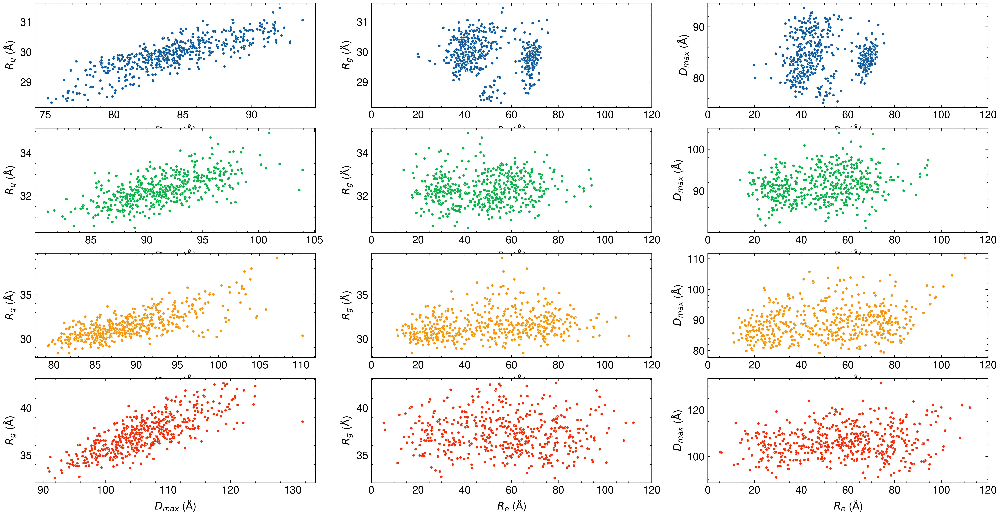

In [116]:
rgs = load_data('rg', 'csv') 
dmaxs = load_data('dmax', 'csv')
e2es = load_data('e2e', 'csv')


figs, axes = plt.subplots(4, 3, figsize=(5, 4))

for i, label in enumerate(labels): 
    sns.scatterplot(x=dmaxs[label]['Dmax'], y=rgs[label]['Rg'], color=colors[label], alpha=1, ax=axes[i, 0])
    axes[i, 0].set_ylabel(r'$R_g$ ($\mathrm{\AA}$)', fontsize=12)
    axes[i, 0].set_xlabel(r'$D_{max}$ ($\mathrm{\AA}$)', fontsize=12)
    sns.scatterplot(x=e2es[label]['end_to_end'], y=rgs[label]['Rg'], color=colors[label], alpha=1, ax=axes[i, 1])
    axes[i, 1].set_ylabel(r'$R_g$ ($\mathrm{\AA}$)', fontsize=12)
    axes[i, 1].set_xlabel(r'$R_e$ ($\mathrm{\AA}$)', fontsize=12)
    axes[i, 1].set_xlim(0, 120)
    sns.scatterplot(x=e2es[label]['end_to_end'], y=dmaxs[label]['Dmax'], color=colors[label], alpha=1, ax=axes[i, 2])
    axes[i, 2].set_ylabel(r'$D_{max}$ ($\mathrm{\AA}$)', fontsize=12)
    axes[i, 2].set_xlabel(r'$R_e$ ($\mathrm{\AA}$)', fontsize=12)   
    axes[i, 2].set_xlim(0, 120)

plt.subplots_adjust(left=-2, right=1, top=2)

deep_recycle Dmax vs Rg: slope = 0.121, intercept = 19.682, r_value = 0.816, p_value = 1.819e-120
deep_dropout Dmax vs Rg: slope = 0.120, intercept = 21.321, r_value = 0.631, p_value = 7.350e-57
shallow_recycle Dmax vs Rg: slope = 0.204, intercept = 13.376, r_value = 0.717, p_value = 4.832e-80
shallow_dropout Dmax vs Rg: slope = 0.236, intercept = 12.168, r_value = 0.784, p_value = 2.438e-105


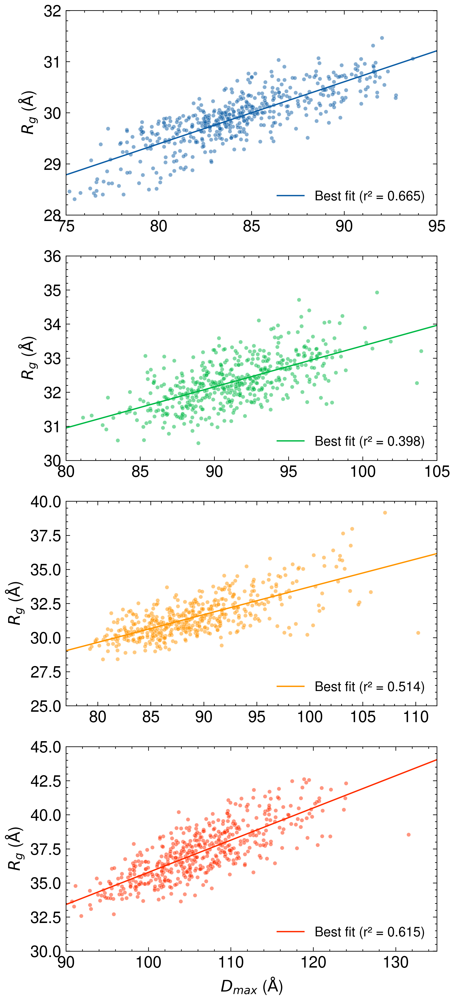

In [117]:
figs, axes = plt.subplots(4, 1, figsize=(5, 9))

for i, label in enumerate(labels): 
    sns.scatterplot(x=dmaxs[label]['Dmax'], y=rgs[label]['Rg'], color=colors[label], alpha=0.5, ax=axes[i])
    axes[i].set_ylabel(r'$R_g$ ($\mathrm{\AA}$)', fontsize=12)
    axes[i].set_xlabel('')
    if label == 'deep_recycle':
        axes[i].set_ylim(28, 32)
        axes[i].set_xlim(75, 95)
    elif label == 'deep_dropout':
        axes[i].set_ylim(30, 36)
        axes[i].set_xlim(80,105)
    elif label == 'shallow_recycle': 
        axes[i].set_ylim(25, 40)
        axes[i].set_xlim(77,112)
    elif label == 'shallow_dropout':
        axes[i].set_ylim(30, 45)
        axes[i].set_xlim(90, 135)
    slope, intercept, r_value, p_value, std_err = linregress(dmaxs[label]['Dmax'], rgs[label]['Rg'])
    print(f'{label} Dmax vs Rg: slope = {slope:.3f}, intercept = {intercept:.3f}, r_value = {r_value:.3f}, p_value = {p_value:.3e}')
    x_predict = np.linspace(dmaxs[label]['Dmax'].min() - 5, dmaxs[label]['Dmax'].max() + 5, 100)
    y_predict = x_predict * slope + intercept
    axes[i].plot(x_predict, y_predict, color=colors[label], alpha=1, label=f'Best fit (r² = {r_value**2:.3f})')
    axes[i].legend(loc='lower right', fontsize=10)    

axes[3].set_xlabel(r'$D_{max}$ ($\mathrm{\AA}$)', fontsize=12) 
plt.subplots_adjust(top=1.2)  

### radius of gyration and average pLDDT

In [118]:
rgs = load_data('rg', 'csv') 
plddt_list = load_data('plddt', 'csv')
rg_plddt = {}
for key, df in plddt_list.items(): 
    plddt_list[key] = df.iloc[:, 1:].mean(axis=0).reset_index(drop=False)
    plddt_list[key].rename(columns={'index': 'file', 0: 'plddt'}, inplace=True)
    rg_plddt[key] = pd.merge(plddt_list[key], rgs[key], on='file')

deep_recycle pLDDT vs Rg: rho = -0.255, p_value = 7.501e-09
deep_dropout pLDDT vs Rg: rho = -0.061, p_value = 1.751e-01
shallow_recycle pLDDT vs Rg: rho = 0.240, p_value = 5.848e-08
shallow_dropout pLDDT vs Rg: rho = -0.070, p_value = 1.173e-01
pLDDT vs Rg (all ensembles): -0.481, p_value = 1.722e-116


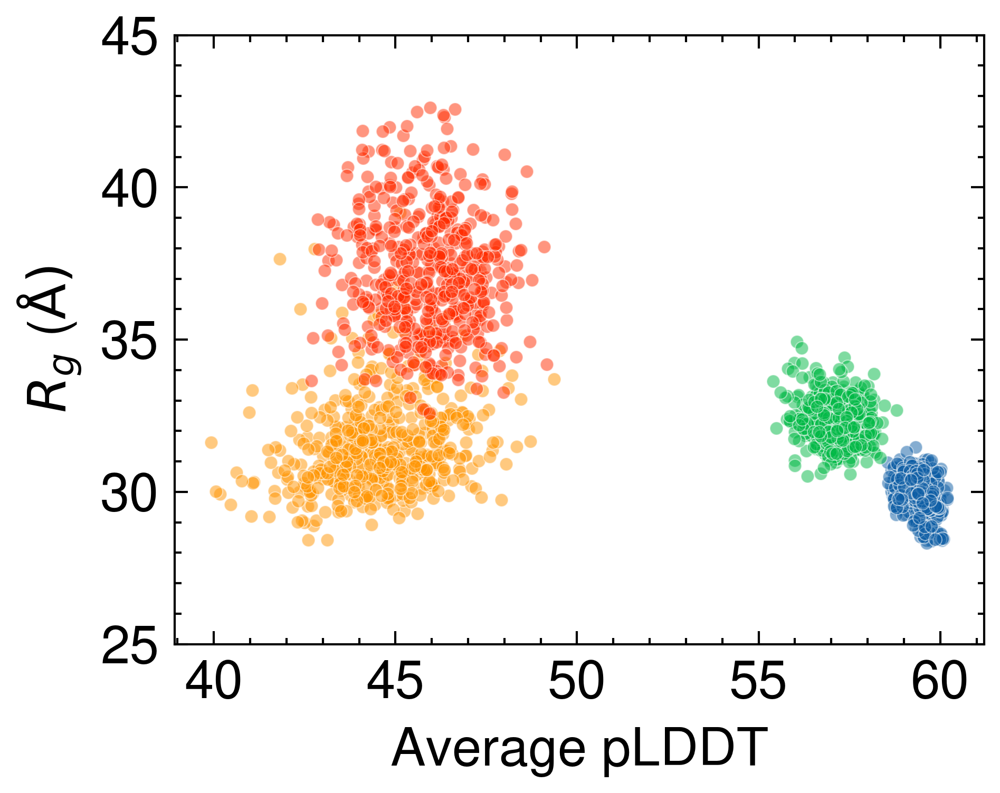

In [124]:
fig, ax = plt.subplots()
rg_all = pd.concat([rg_plddt[label] for label in labels], ignore_index=True)
plddt_all = pd.concat([plddt_list[label] for label in labels], ignore_index=True)
for i, label in enumerate(labels):  
    sns.scatterplot(data=rg_plddt[label], x='plddt', y='Rg', color=colors[label], label=labels[label], alpha=0.5, ax=ax)
    rho, pval = spearmanr(rg_plddt[label]['plddt'], rg_plddt[label]['Rg'])
    print(f'{label} pLDDT vs Rg: rho = {rho:.3f}, p_value = {pval:.3e}')

rho_all, pval_all = spearmanr(plddt_all['plddt'], rg_all['Rg'])
print(f'pLDDT vs Rg (all ensembles): {rho_all:.3f}, p_value = {pval_all:.3e}')
ax.set_ylabel(r'$R_g$ ($\mathrm{\AA})$')
ax.set_xlabel(r'Average pLDDT')
ax.set_ylim(25, 45)
ax.get_legend().remove()
plt.savefig(save_dir + 'scatter_rg_plddt.pdf', dpi=600, bbox_inches='tight')

### per-residue pLDDT and per-residue helicity

In [63]:
helix_list = load_data('helix_percent', 'csv')
plddt_list = load_data('plddt', 'csv')
helix_plddt = {}
for key, df in plddt_list.items(): 
    plddt_list[key] = df.iloc[:, 1:].mean(axis=1).reset_index(drop=False)
    plddt_list[key].rename(columns={'index': 'Residue', 0: 'plddt'}, inplace=True)
    plddt_list[key]['Residue'] = plddt_list[key]['Residue'] + 1 
    helix_plddt[key] = pd.merge(helix_list[key], plddt_list[key], on='Residue')

Spearman correlation for deep_recycle: 0.667
Spearman correlation for deep_dropout: 0.794
Spearman correlation for shallow_recycle: 0.790
Spearman correlation for shallow_dropout: 0.741


Text(0.5, 0, 'Per-residue pLDDT')

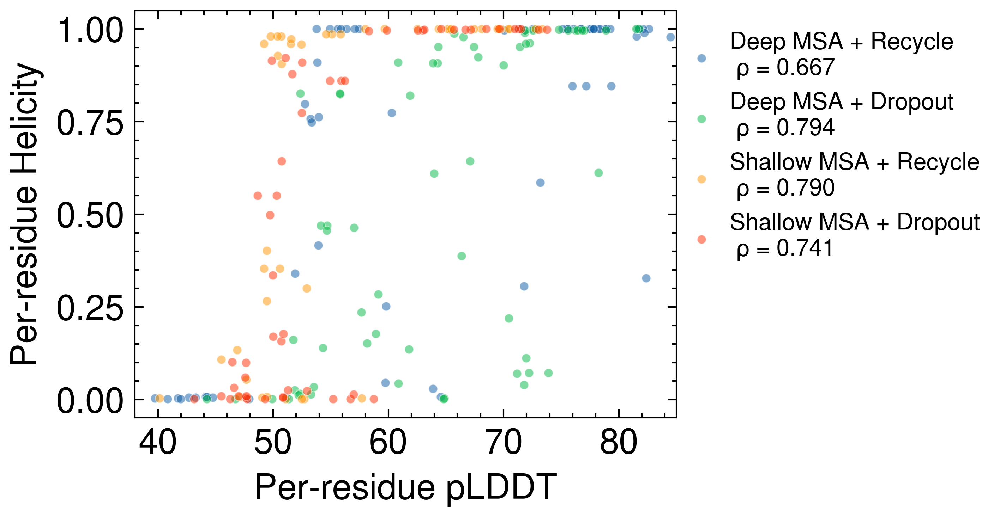

In [78]:
fig, ax = plt.subplots()
for i, label in enumerate(labels):  
    mask = helix_plddt[label]['helix'] > 0.0
    rho, pval = spearmanr(helix_plddt[label][mask]['plddt'], helix_plddt[label][mask]['helix'])
    print(f"Spearman correlation for {label}: {rho:.3f}")
    sns.scatterplot(data=helix_plddt[label][mask], x='plddt', y='helix', color=colors[label], label=f"{labels[label]}\n ρ = {rho:.3f}", alpha=0.5, ax=ax)
ax.legend(loc='upper right', bbox_to_anchor=(1.6, 1.00), handletextpad=0.2, fontsize=8)
ax.set_xlim(38, 85)
ax.set_ylabel('Per-residue Helicity')
ax.set_xlabel('Per-residue pLDDT')

### per-residue $\Delta \psi$ and $\Delta \phi$

In [79]:
deltaphi_list = load_data('phi', 'csv')
deltapsi_list = load_data('psi', 'csv')
for key, df in deltaphi_list.items():
    deltaphi_list[key] = circstd(df.iloc[:, 1:], high=180, low=-180, axis=1)
for key, df in deltapsi_list.items():
    deltapsi_list[key] = circstd(df.iloc[:, 1:], high=180, low=-180, axis=1)

Spearman correlation for deep_recycle: 0.884
Spearman correlation for deep_dropout: 0.815
Spearman correlation for shallow_recycle: 0.752
Spearman correlation for shallow_dropout: 0.484


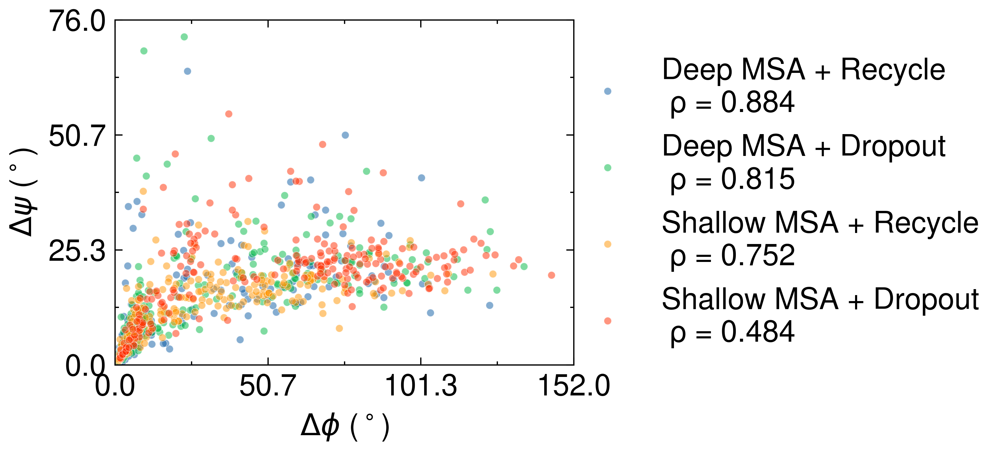

In [80]:
fig, ax = plt.subplots()
for i, label in enumerate(labels):  
    # First and last residues need to be removed from deltaphi and deltapsi because they are nan 
    rho, pval = spearmanr(deltaphi_list[label][1:-1], deltapsi_list[label][1:-1])
    print(f"Spearman correlation for {label}: {rho:.3f}")
    sns.scatterplot(x=deltaphi_list[label][1:-1], y=deltapsi_list[label][1:-1], color=colors[label], label=f"{labels[label]}\n ρ = {rho:.3f}", alpha=0.5, ax=ax)
ax.legend(bbox_to_anchor=(0.95, 0.97), fontsize=12)

ax.set_xlabel(r'$\Delta \phi$ ($^\circ$)')
ax.set_ylabel(r'$\Delta \psi$ ($^\circ$)')
setup(ax, 4, 4, 2, 2)
ax.set_ylim(0, 76)
ax.set_xlim(0, 152)

plt.savefig(save_dir + 'torsional_flexibility_corr.pdf', dpi=600, bbox_inches='tight')

### per-residue $\Delta \psi$ and $\Delta \phi$, helicity

In [81]:
helix_list = load_data('helix_percent', 'csv')

Spearman correlation for deep_recycle: -0.468
Spearman correlation for deep_dropout: -0.613
Spearman correlation for shallow_recycle: -0.507
Spearman correlation for shallow_dropout: -0.306


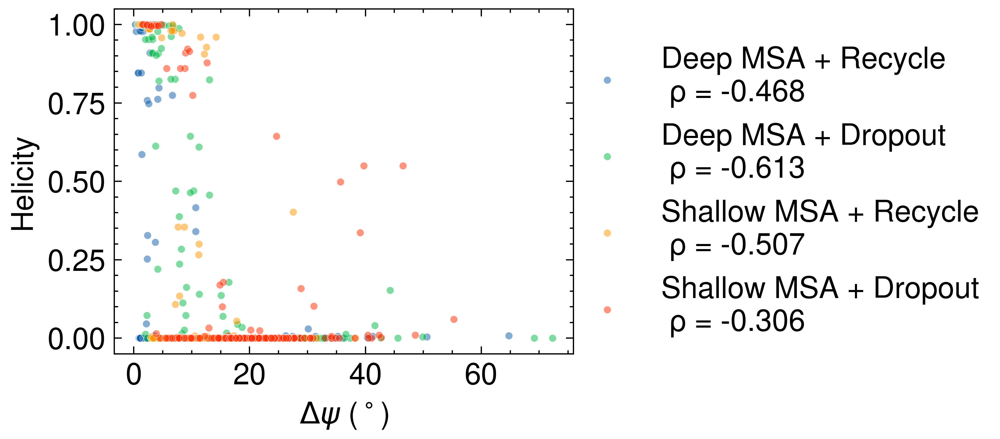

In [82]:
fig, ax = plt.subplots()
angles = ['phi', 'psi']; angle = angles[1]
for i, label in enumerate(labels):  
    if angle == 'phi':
        x = deltaphi_list[label][1:-1]
    if angle == 'psi':
        x = deltapsi_list[label][1:-1]
    y = helix_list[label]['helix'][1:-1]
    rho, pval = spearmanr(x, y)
    print(f"Spearman correlation for {label}: {rho:.3f}")
    sns.scatterplot(x=x, y=y, color=colors[label], label=f"{labels[label]}\n ρ = {rho:.3f}", alpha=0.5, ax=ax)
if angle == 'phi':
    ax.set_xlabel(r'$\Delta \phi$ ($^\circ$)')
if angle == 'psi':
    ax.set_xlabel(r'$\Delta \psi$ ($^\circ$)')
ax.set_ylabel('Helicity')
ax.legend(bbox_to_anchor=(0.95, 0.97), fontsize=12)
figname = 'deltaphi_vs_helicity.pdf' if angle == 'phi' else 'deltapsi_vs_helicity.pdf'

# plt.savefig(save_dir + figname, dpi=600, bbox_inches='tight')